# 1. Introduction to Decision Tree
- In Decision Tree Learning, a new example is classified by submitting it to a series of tests that determine the class label of the example. These tests are organized in a hierarchical structure called a decision tree.

## Example1 : Recommending Apps

### Suppose we are interested in recommending the users which app to download and we have two features 'Gender' and 'Occupation'

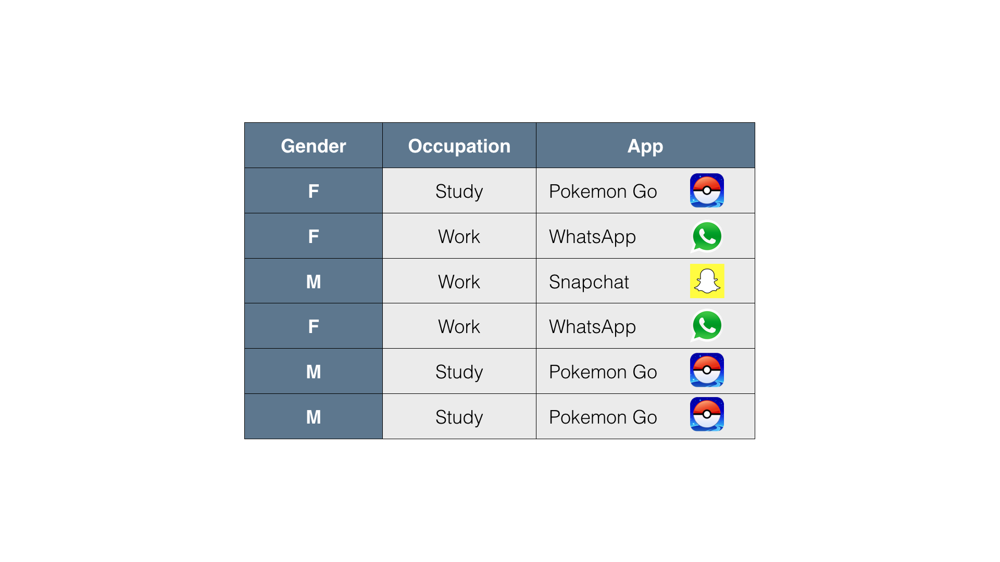

#### Question 1: Woman, works at  an office, what app do we recommend?

Answer: WhatsApp

#### Question 2: Man, works at  a factory, what app do we recommend?

Answer: Snapchat

#### Question 3: For a girl who goes to high school, which app do we recommend?

Answer: Pokeman Go

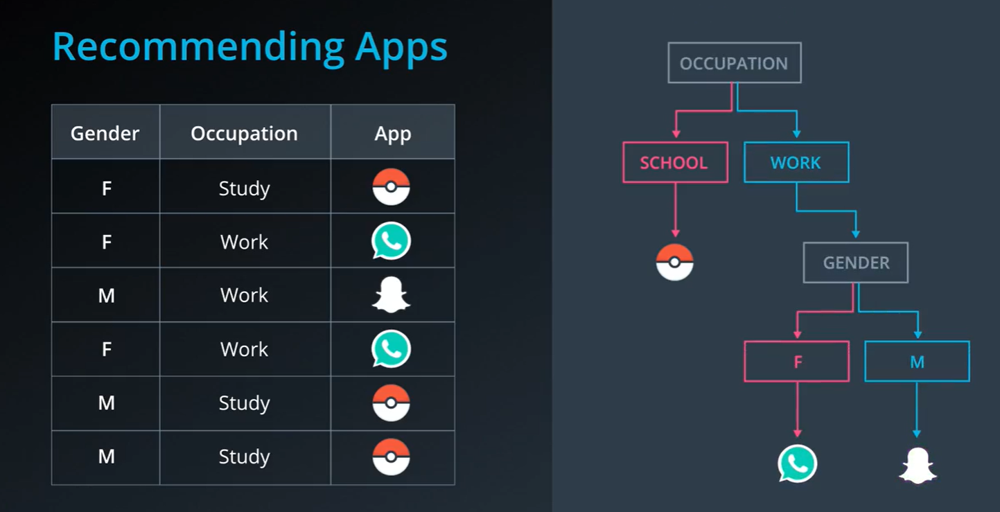

#### Question: Between Gender and Occupation, which one seems more decisive for predicting what app will the users download?

Answer: Occupation

## Example2: Student Admissions

### Our goal is to accept student or not accept for the college admission on the basis of two features: Entrance test and Grades from school

#### Question 1: Between grades and test, which one determines student acceptance better? OR Between a horizontal and a vertical line, which one cut the data better?

Answer: Test

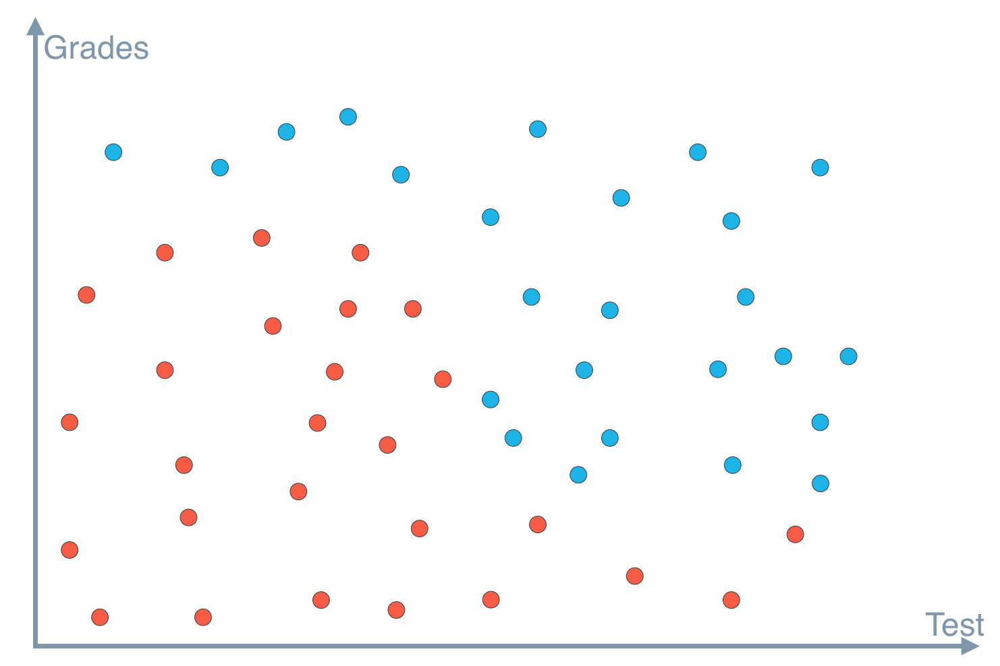

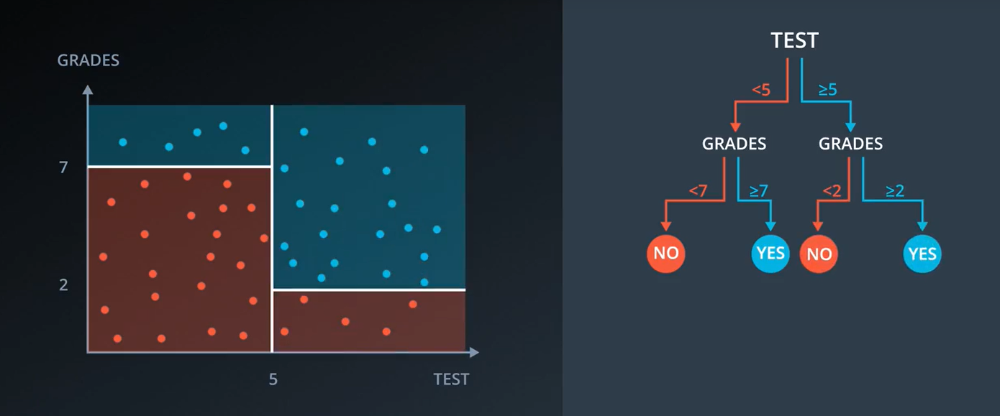

# 2. Entropy

- Entropy is a measure of un-orderedness
- We want a measure that prefers attributes that have a high degree of 'order'
    - Maximum Order: All examples are of same class
    - Minimum Order: All classes are equally likely
- Another interpretation of Entropy is 'Entropy is the amount of information that is contained'
    - All examples of same class means no/low information

#### In terms of unorderedness
    - First bucket is very rigid, so has low entropy
    - Second bucket has medium entropy
    - Third bucket has high entropy
- So, we can say that `More rigid the set is or more homogeneous the set is, the less entropy you have and vice-versa`

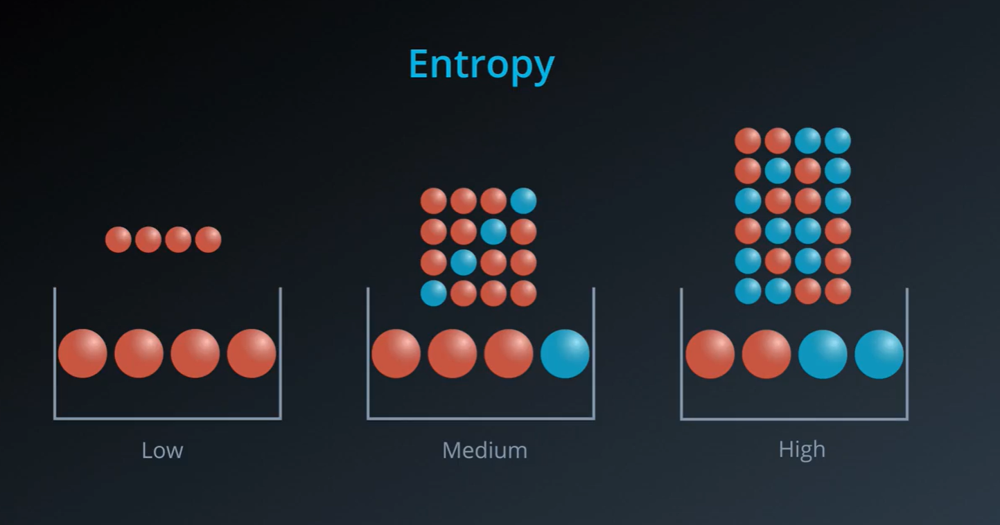

#### In terms of Information/Knowledge
    - In first bucket, we have high knowledge, so has low entropy
    - In the second bucket, we have medium knowledge, so medium entropy
    - In the third bucket, we have has low knowledge, so high entropy
- So, we can say that `Entropy and knowledge are opposites`

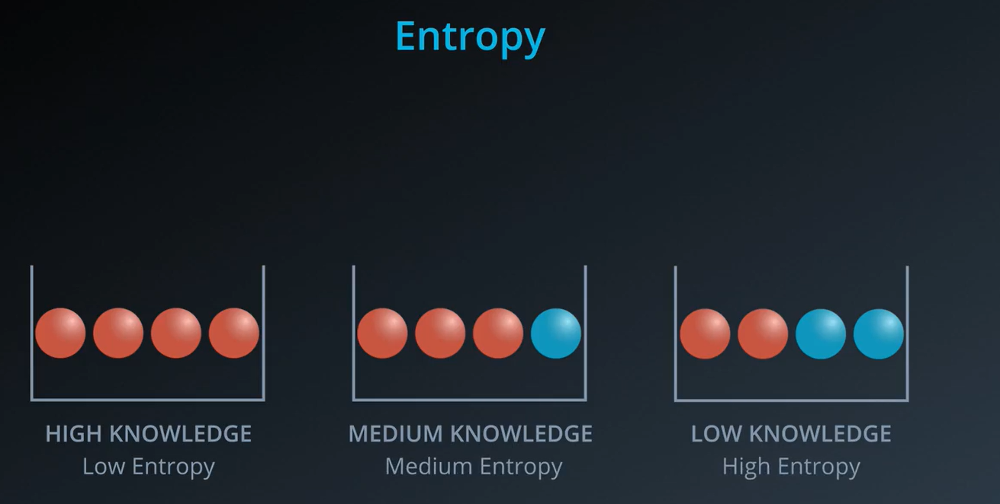

### 1. Formula for Entropy

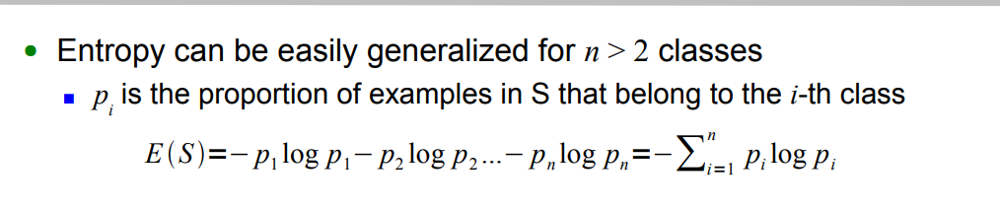

### 2. Calculating Entropy in our example of 4 balls

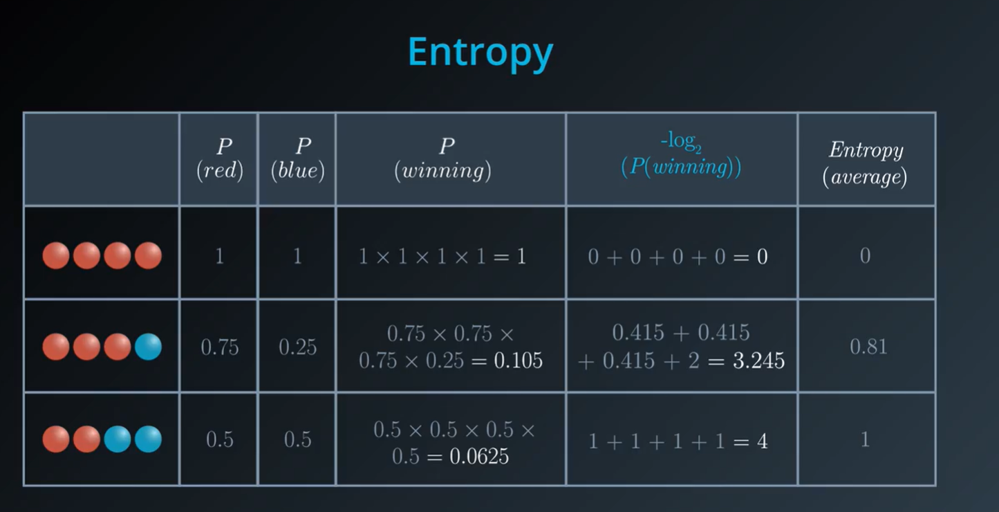

### 3. Formula for Entropy when we have 5 red balls and 3 blue balls

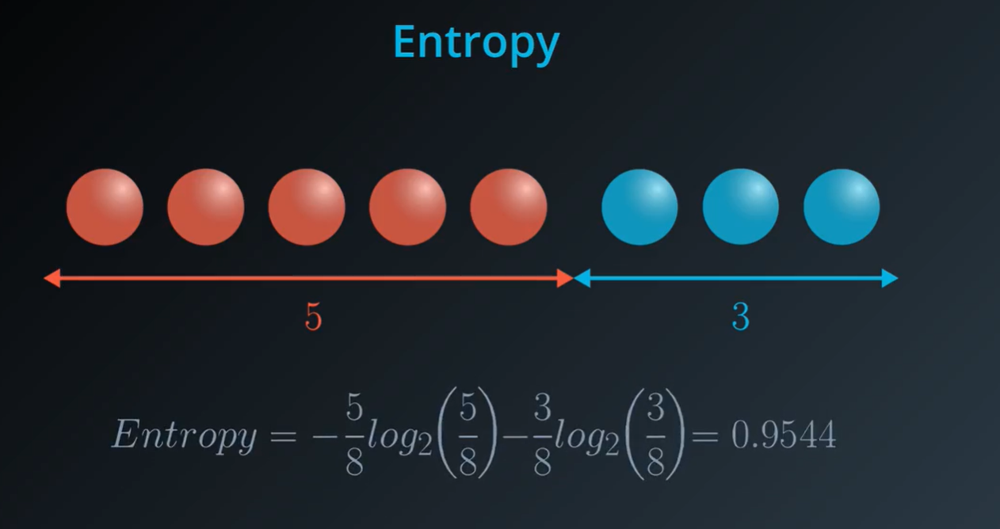

### 4. Entropy Summary

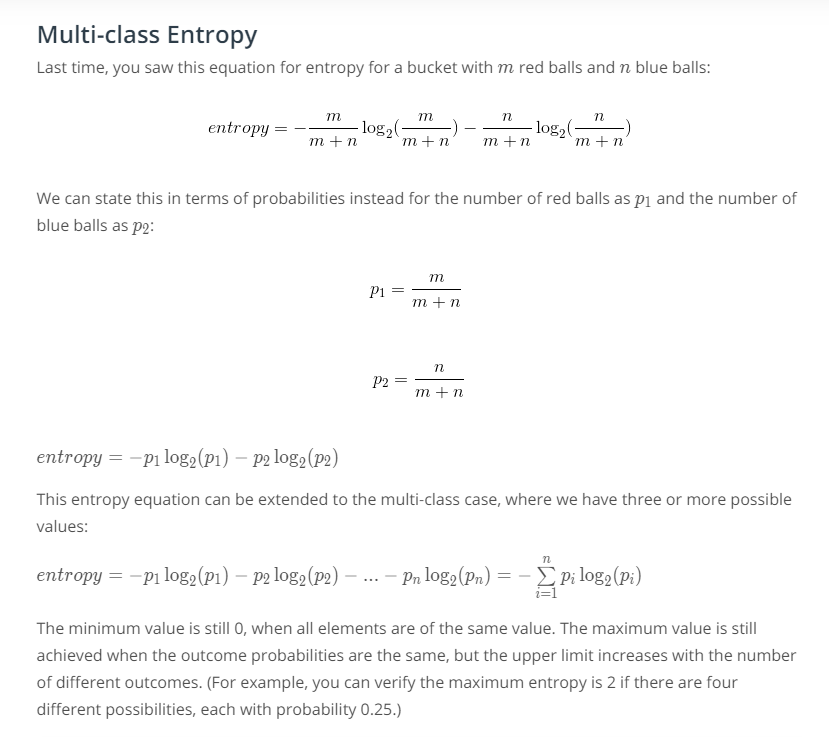

# 3. Information Gain

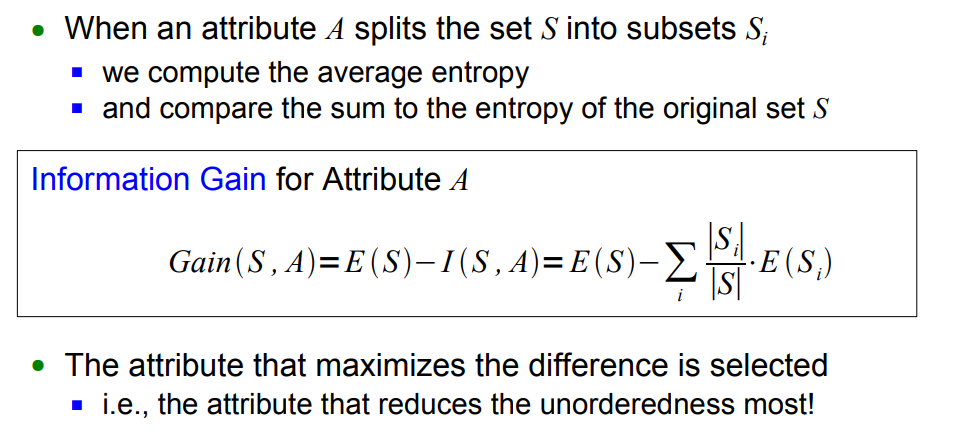

- __Information Gain__ is nothing but change in Entropy
- We want a measure that prefers attributes that have a high degree of 'order' or the minimizes the entropy or that maximizes the __Information Gain__
- Maximizing information gain is equivalent to minimizing the weighted average entropy, because E(S) is contant for all attributes of A.

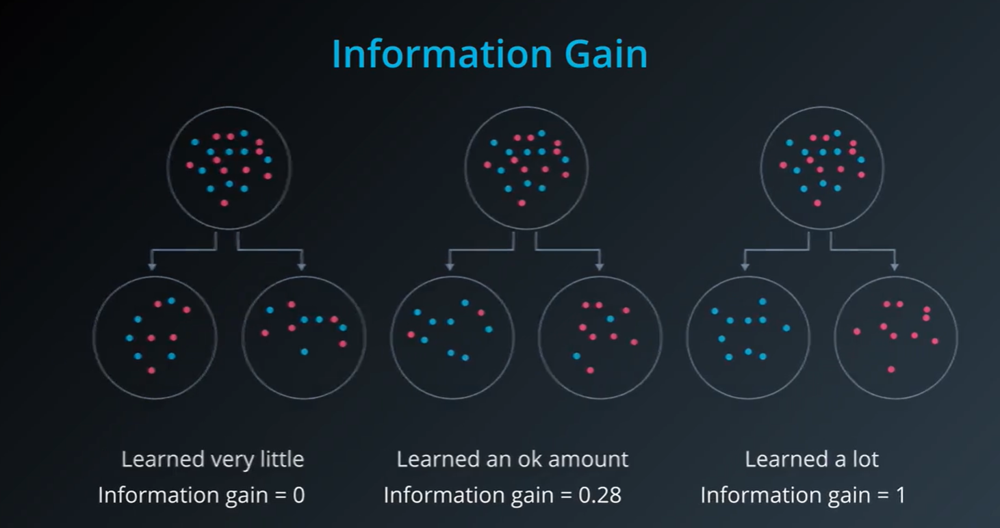

# 4. Maximizing Information Gain

## Example 1: Recommending Apps

### Step 1: Calculate the Entropy of the Parent i.e. labels

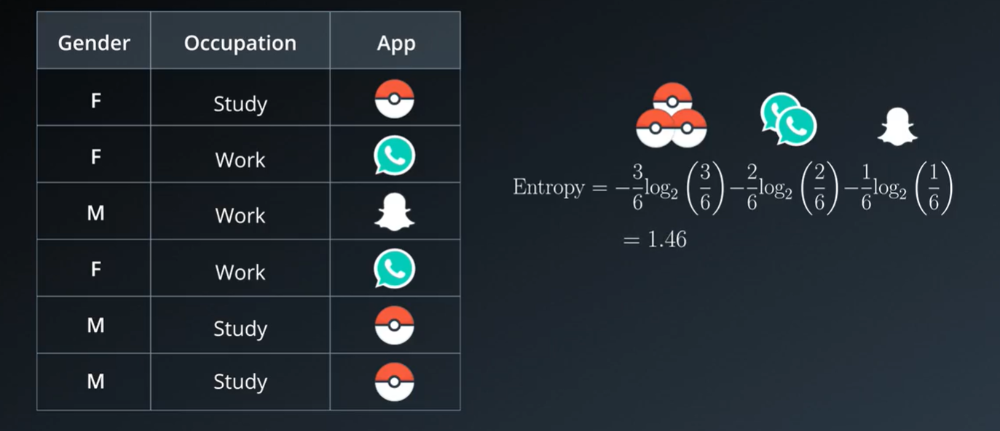

### Step 2: Calculate the Entropy of Age & Information Gain

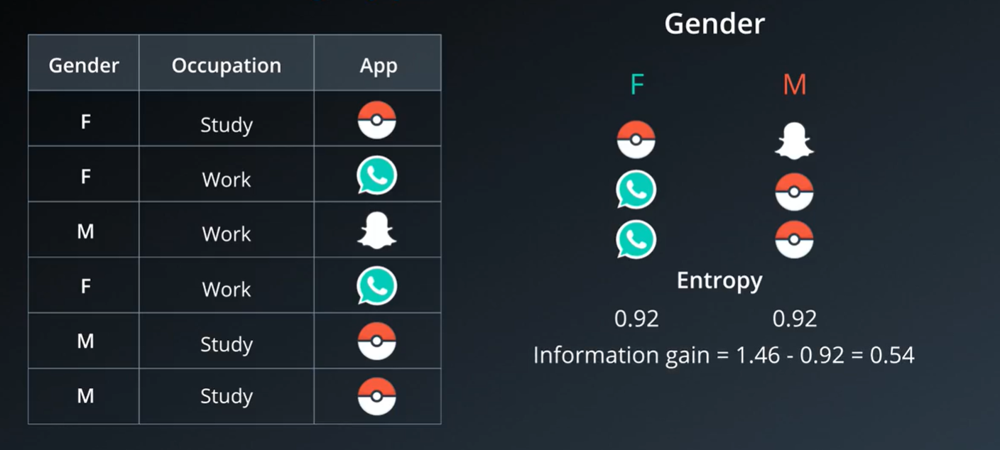

### Step 3: Calculate the Entropy of Occupation & Information Gain

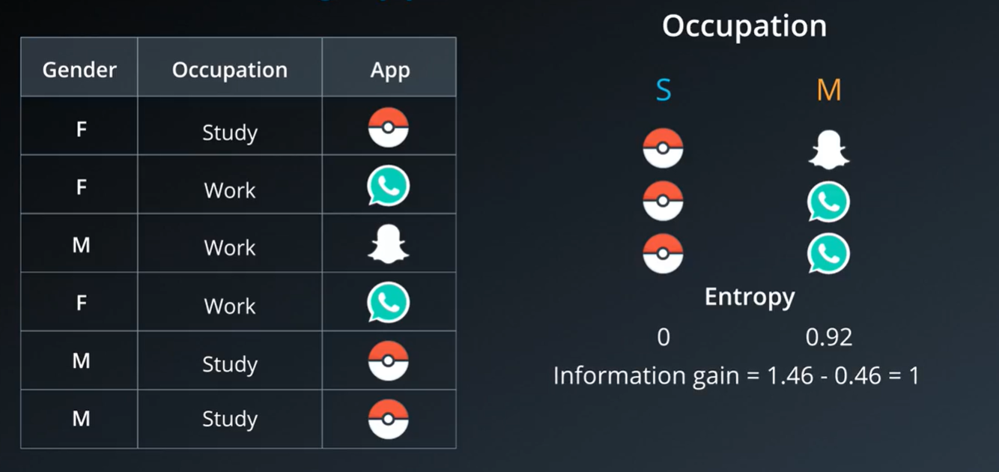

### Step 4: The Algorithm says pick the column with highest Information Gain first, which is Occupation here

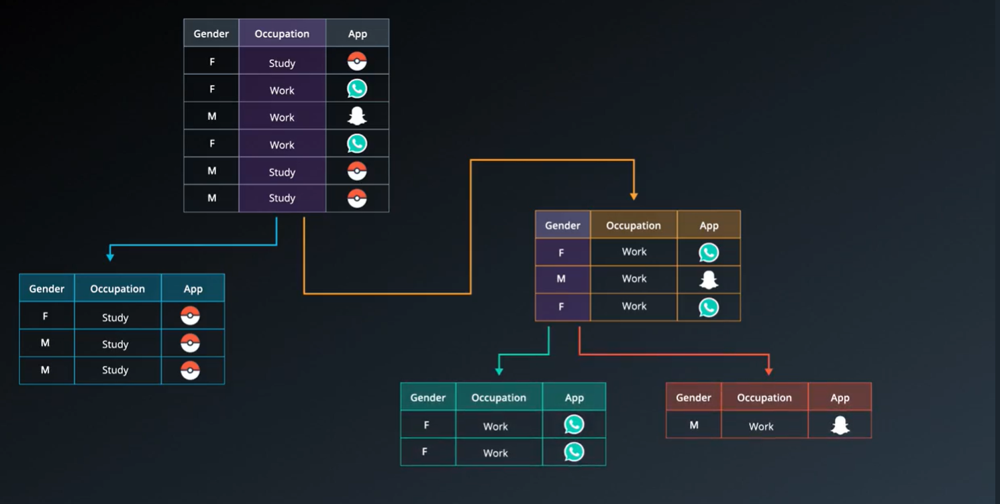

## Example 2: Student Admissions

- We can use the Algorithm for __Continuous features__ instead of __Discrete features__

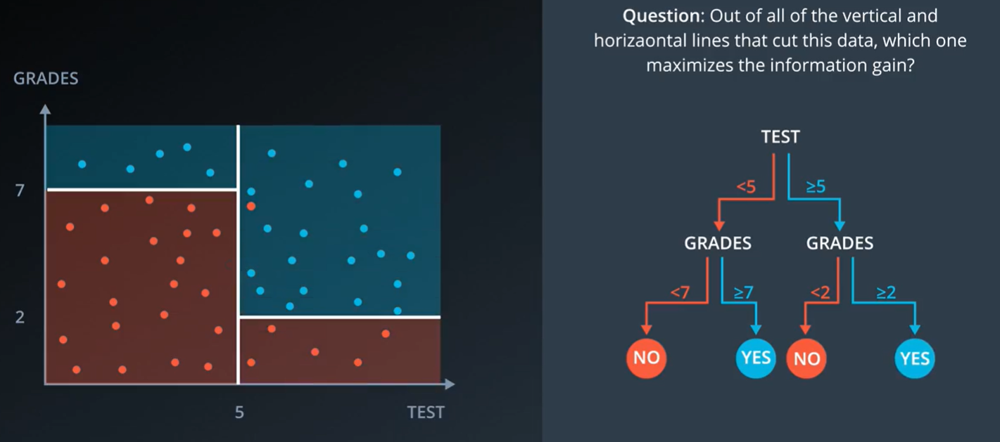

# 5. Random Forest

- Consider a case where we have so many features present in our dataset, using decision trees algorithm can lead to overfitting

### Example1: In case of humongous data, decision tree tends to Overfit, as it seems that the tree memorize the data.

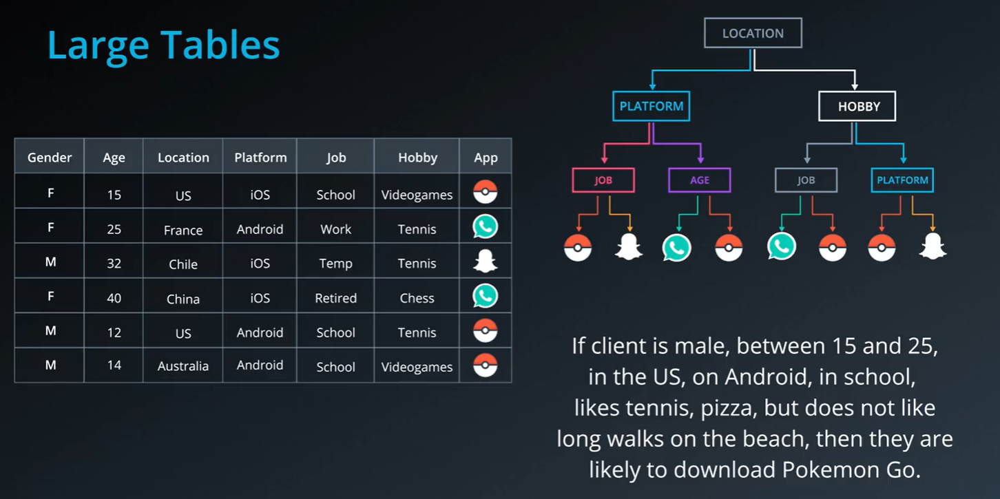

### Example2: In Continuous, the decision tree has many nodes, that can give complicated boundaries that can pretty much borders every point with a small square. So, leads to overfitting

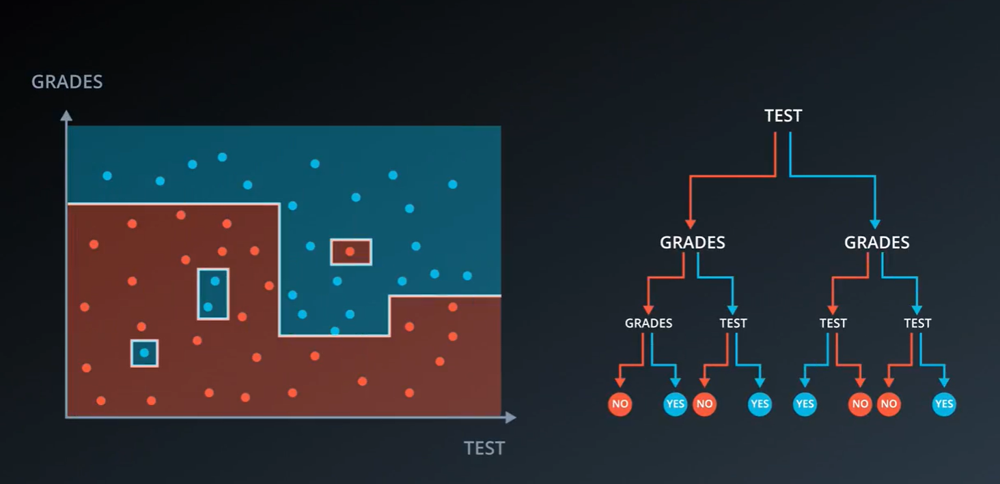

### Question: How Random Forest solves this problem?

- In simple words, we pick some columns and some some randomly and build a decision tree and repeat the process
- Let the trees vote and pick the one with the maximum votes

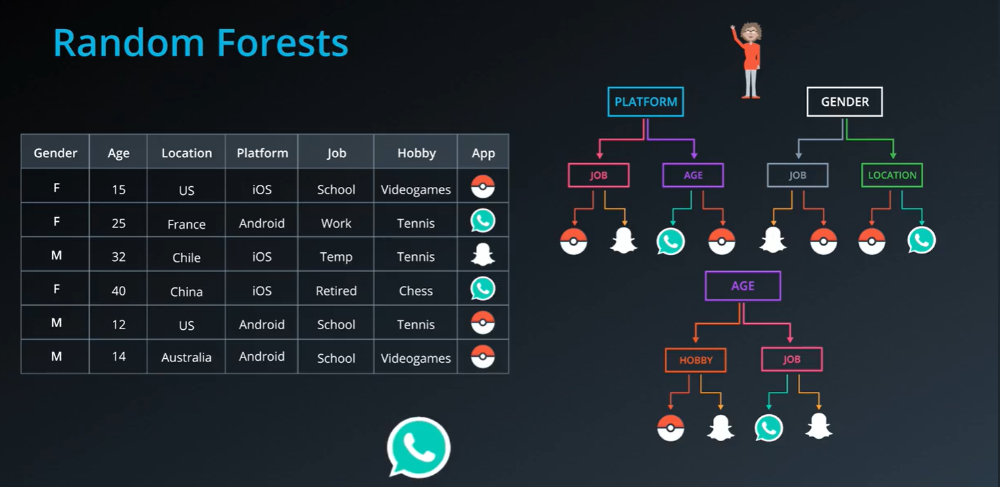

# 6. Hyperparameters of Decision Trees

- A Decision Tree consists of
    - Nodes: Test for the value of a certain attribute
    - Edges: correspond to the outcomeof a test & connect to the next node or leaf
    - Leaves: Terminal nodes that predictthe outcome    
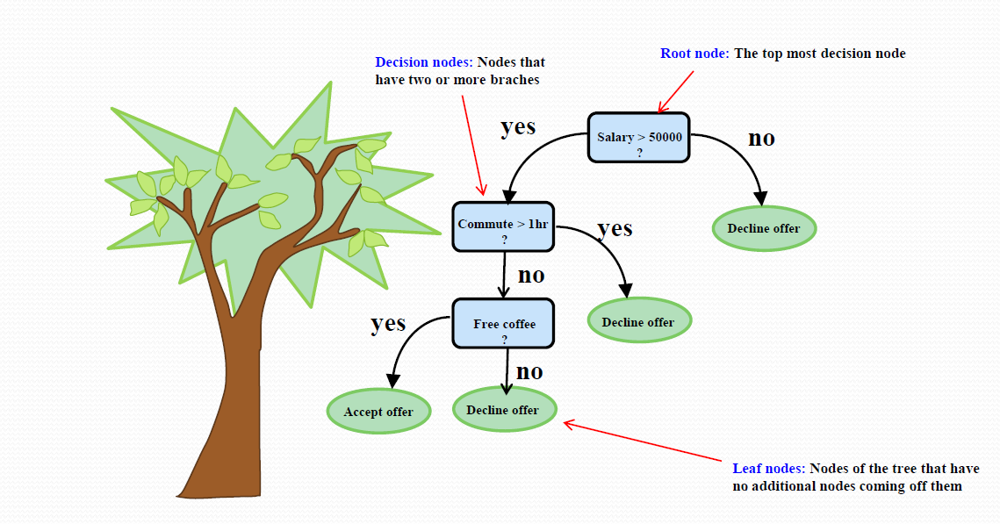

- In order to create decision trees that will generalize to new problems well, we can tune a number of different aspects about the trees. We call the different aspects of a decision tree "hyperparameters".
- These are some of the most important hyperparameters used in decision trees:

## A. Maximum Depth
- The maximum depth of a decision tree is simply the largest possible length between the root to a leaf. A tree of maximum length $k$ can have at most $2^k$ leaves.
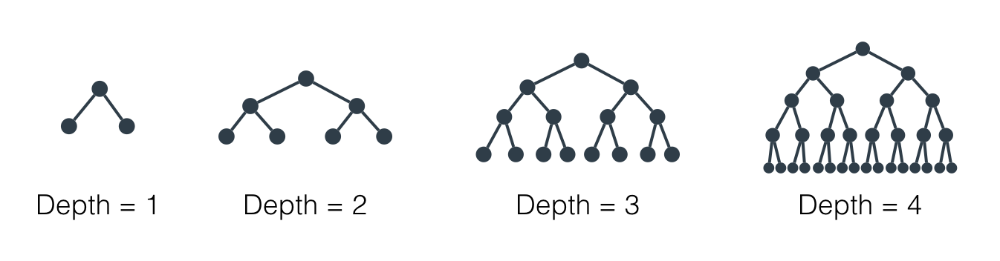

## B. Minimum number of samples to split
- A node must have at least min_samples_split samples in order to be large enough to split. If a node has fewer samples than min_samples_split samples, it will not be split, and the splitting process stops.
- However, min_samples_split doesn't control the minimum size of leaves. As you can see in the example on the right, above, the parent node had 20 samples, greater than min_samples_split = 11, so the node was split. But when the node was split, a child node was created with that had 5 samples, less than min_samples_split = 11.
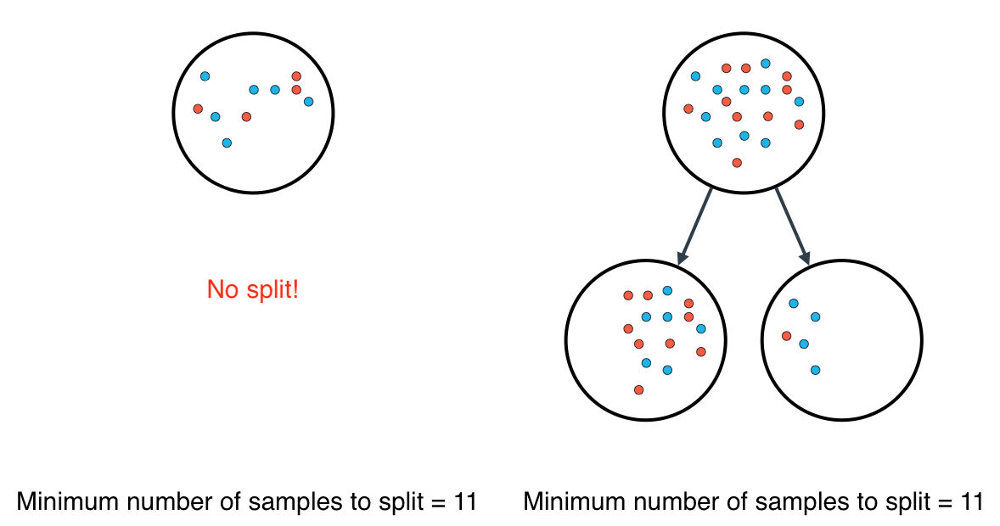

## C. Minimum number of samples per leaf
- When splitting a node, one could run into the problem of having 99 samples in one of them, and 1 on the other. This will not take us too far in our process, and would be a waste of resources and time. If we want to avoid this, we can set a minimum for the number of samples we allow on each leaf.
- This number can be specified as an __integer or as a float__. If it's an __integer__, it's the minimum number of samples allowed in a leaf. If it's a __float__, it's the minimum percentage of samples allowed in a leaf. For example, 0.1, or 10%, implies that a particular split will not be allowed if one of the leaves that results contains less than 10% of the samples in the dataset.
- If a threshold on a feature results in a leaf that has fewer samples than min_samples_leaf, the algorithm will not allow that split, but it may perform a split on the same feature at a different threshold, that does satisfy min_samples_leaf.

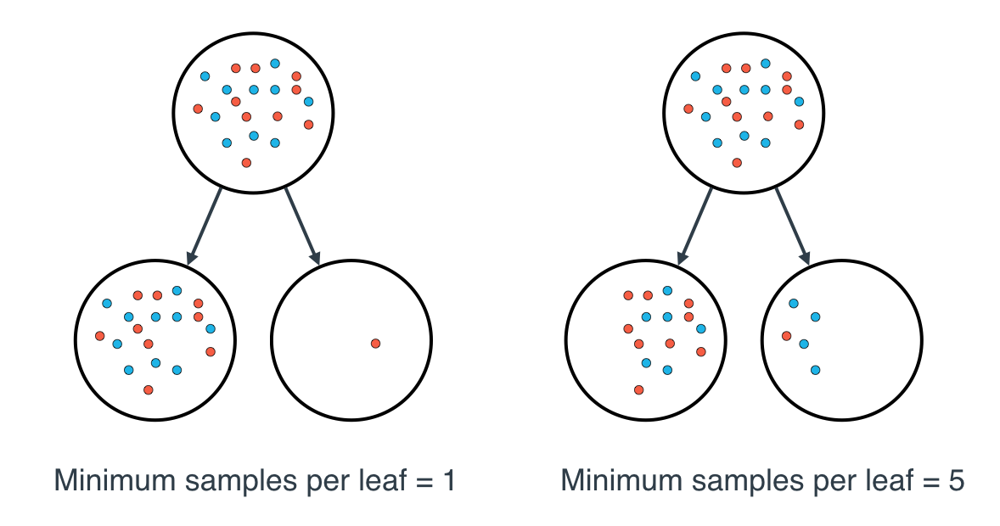

## Note:
- Large depth very often causes overfitting, since a tree that is too deep, can memorize the data. Small depth can result in a very simple model, which may cause underfitting.
- Small minimum samples per split may result in a complicated, highly branched tree, which can mean the model has memorized the data, or in other words, overfit. Large minimum samples may result in the tree not having enough flexibility to get built, and may result in underfitting.

# 7. Decision Trees in sklearn

In [1]:
# Import libraries
import pandas as pd
import numpy as np

In [2]:
# Read the data
data = pd.read_csv('decision_trees_data.csv', header = None)
data.sample(5)

,0,1,2
20,0.731570,0.25000,0
13,0.266130,0.63596,0
77,0.079493,0.91374,1
3,0.201610,0.58041,0
23,0.660140,0.34649,0


In [3]:
# Assign the features to the variable X, and the labels to the variable y. 
X = data[[0, 1]]
y = data[2]

In [4]:
# Import other libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

### 1. Base Model

In [5]:
# Fit the model
model = DecisionTreeClassifier()
model.fit(X, y)

DecisionTreeClassifier()

In [6]:
# Make predictions. Store them in the variable y_pred.
y_pred = model.predict(X)

In [7]:
# Calculate the accuracy and assign it to the variable acc.
acc = accuracy_score(y, y_pred)
acc

1.0

### 2. Model with Hyperparameters Tuning
- max_depth: The maximum number of levels in the tree.
- min_samples_leaf: The minimum number of samples allowed in a leaf.
- min_samples_split: The minimum number of samples required to split an internal node.

In [8]:
# Fit the model
# Here, we define a model where the maximum depth of the trees max_depth is 7,
# and the minimum number of elements in each leaf min_samples_leaf is 10.
model2 = DecisionTreeClassifier(max_depth = 7, min_samples_leaf = 10)
model2.fit(X, y)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10)

In [9]:
# Make predictions. Store them in the variable y_pred2
y_pred2 = model2.predict(X)

In [10]:
# Calculate the accuracy and assign it to the variable acc2
acc2 = accuracy_score(y, y_pred2)
acc2

0.8333333333333334

# 8. Titanic Survival Exploration with Decision Trees

In [11]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from IPython.display import display # Allows the use of display() for DataFrames

In [12]:
# Pretty display of notebooks
%matplotlib inline

In [13]:
# Set a random seed
import random
random.seed(42)

In [14]:
# Load Dataset
in_file = 'titanic_data.csv'
full_data = pd.read_csv(in_file)

In [15]:
# Print the first few entries of the RMS titanic data
display(full_data.head())

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


### Understanding the dataset
Recall that these are the various features present for each passenger on the ship:
- **Survived**: Outcome of survival (0 = No; 1 = Yes)
- **Pclass**: Socio-economic class (1 = Upper class; 2 = Middle class; 3 = Lower class)
- **Name**: Name of passenger
- **Sex**: Sex of the passenger
- **Age**: Age of the passenger (Some entries contain `NaN`)
- **SibSp**: Number of siblings and spouses of the passenger aboard
- **Parch**: Number of parents and children of the passenger aboard
- **Ticket**: Ticket number of the passenger
- **Fare**: Fare paid by the passenger
- **Cabin** Cabin number of the passenger (Some entries contain `NaN`)
- **Embarked**: Port of embarkation of the passenger (C = Cherbourg; Q = Queenstown; S = Southampton)

Since we're interested in the outcome of survival for each passenger or crew member, we can remove the **Survived** feature from this dataset and store it as its own separate variable `outcomes`. We will use these outcomes as our prediction targets.  
Run the code cell below to remove **Survived** as a feature of the dataset and store it in `outcomes`.

In [16]:
# Store the 'Survived' feature in a new variable and remove it from the dataset
outcomes = full_data['Survived']
features_raw = full_data.drop('Survived', axis = 1)

In [17]:
# Show the dataset with 'Survived' removed
display(features_raw.head())

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [18]:
# Show the outcomes dataset
display(outcomes.head())

0    0
1    1
2    1
3    1
4    0
Name: Survived, dtype: int64

The very same sample of the RMS Titanic data now shows the **Survived** feature removed from the DataFrame. Note that `data` (the passenger data) and `outcomes` (the outcomes of survival) are now *paired*. That means for any passenger `data.loc[i]`, they have the survival outcome `outcomes[i]`.

### Preprocessing the data

Now, let's do some data preprocessing. First, we'll remove the names of the passengers, and then one-hot encode the features.

**Question:** Why would it be a terrible idea to one-hot encode the data without removing the names?

**Answer:** If we one-hot encode the names columns, then there would be one column for each name, and the model would be learn the names of the survivors, and make predictions based on that. This would lead to some serious overfitting!

In [19]:
# Changing the maximum coumn visibility
pd.options.display.max_columns = None

In [20]:
# Removing the names
features_no_name = features_raw.drop(['Name'], axis=1)

# One-hot encoding
features = pd.get_dummies(features_no_name)
features

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Ticket_110152,Ticket_110413,Ticket_110465,Ticket_110564,Ticket_110813,Ticket_111240,Ticket_111320,Ticket_111361,Ticket_111369,Ticket_111426,Ticket_111427,Ticket_111428,Ticket_112050,Ticket_112052,Ticket_112053,Ticket_112058,Ticket_112059,Ticket_112277,Ticket_112379,Ticket_113028,Ticket_113043,Ticket_113050,Ticket_113051,Ticket_113055,Ticket_113056,Ticket_113059,Ticket_113501,Ticket_113503,Ticket_113505,Ticket_113509,Ticket_113510,Ticket_113514,Ticket_113572,Ticket_113760,Ticket_113767,Ticket_113773,Ticket_113776,Ticket_113781,Ticket_113783,Ticket_113784,Ticket_113786,Ticket_113787,Ticket_113788,Ticket_113789,Ticket_113792,Ticket_113794,Ticket_113796,Ticket_113798,Ticket_113800,Ticket_113803,Ticket_113804,Ticket_113806,Ticket_113807,Ticket_11668,Ticket_11751,Ticket_11752,Ticket_11753,Ticket_11755,Ticket_11765,Ticket_11767,Ticket_11769,Ticket_11771,Ticket_11774,Ticket_11813,Ticket_11967,Ticket_12233,Ticket_12460,Ticket_12749,Ticket_13049,Ticket_13213,Ticket_13214,Ticket_13502,Ticket_13507,Ticket_13509,Ticket_13567,Ticket_13568,Ticket_14311,Ticket_14312,Ticket_14313,Ticket_14973,Ticket_1601,Ticket_16966,Ticket_16988,Ticket_17421,Ticket_17453,Ticket_17463,Ticket_17464,Ticket_17465,Ticket_17466,Ticket_17474,Ticket_17764,Ticket_19877,Ticket_19928,Ticket_19943,Ticket_19947,Ticket_19950,Ticket_19952,Ticket_19972,Ticket_19988,Ticket_19996,Ticket_2003,Ticket_211536,Ticket_21440,Ticket_218629,Ticket_219533,Ticket_220367,Ticket_220845,Ticket_2223,Ticket_223596,Ticket_226593,Ticket_226875,Ticket_228414,Ticket_229236,Ticket_230080,Ticket_230136,Ticket_230433,Ticket_230434,Ticket_231919,Ticket_231945,Ticket_233639,Ticket_233866,Ticket_234360,Ticket_234604,Ticket_234686,Ticket_234818,Ticket_236171,Ticket_236852,Ticket_236853,Ticket_237442,Ticket_237565,Ticket_237668,Ticket_237671,Ticket_237736,Ticket_237789,Ticket_237798,Ticket_239853,Ticket_239854,Ticket_239855,Ticket_239856,Ticket_239865,Ticket_240929,Ticket_24160,Ticket_243847,Ticket_243880,Ticket_244252,Ticket_244270,Ticket_244278,Ticket_244310,Ticket_244358,Ticket_244361,Ticket_244367,Ticket_244373,Ticket_248698,Ticket_248706,Ticket_248723,Ticket_248727,Ticket_248731,Ticket_248733,Ticket_248738,Ticket_248740,Ticket_248747,Ticket_250643,Ticket_250644,Ticket_250646,Ticket_250647,Ticket_250648,Ticket_250649,Ticket_250651,Ticket_250652,Ticket_250653,Ticket_250655,Ticket_2620,Ticket_2623,Ticket_2624,Ticket_2625,Ticket_2626,Ticket_2627,Ticket_2628,Ticket_2629,Ticket_2631,Ticket_26360,Ticket_2641,Ticket_2647,Ticket_2648,Ticket_2649,Ticket_2650,Ticket_2651,Ticket_2653,Ticket_2659,Ticket_2661,Ticket_2662,Ticket_2663,Ticket_2664,Ticket_2665,Ticket_2666,Ticket_2667,Ticket_2668,Ticket_2669,Ticket_26707,Ticket_2671,Ticket_2672,Ticket_2674,Ticket_2677,Ticket_2678,Ticket_2680,Ticket_2683,Ticket_2685,Ticket_2686,Ticket_2687,Ticket_2689,Ticket_2690,Ticket_2691,Ticket_2693,Ticket_2694,Ticket_2695,Ticket_2697,Ticket_2699,Ticket_2700,Ticket_27042,Ticket_27267,Ticket_27849,Ticket_28134,Ticket_28206,Ticket_28213,Ticket_28220,Ticket_28228,Ticket_28403,Ticket_28424,Ticket_28425,Ticket_28551,Ticket_28664,Ticket_28665,Ticket_29011,Ticket_2908,Ticket_29103,Ticket_29104,Ticket_29105,Ticket_29106,Ticket_29108,Ticket_2926,Ticket_29750,Ticket_29751,Ticket_3101264,Ticket_3101265,Ticket_3101267,Ticket_3101276,Ticket_3101277,Ticket_3101278,Ticket_3101281,Ticket_3101295,Ticket_3101296,Ticket_3101298,Ticket_31027,Ticket_31028,Ticket_312991,Ticket_312992,Ticket_312993,Ticket_31418,Ticket_315037,Ticket_315082,Ticket_315084,Ticket_315086,Ticket_315088,Ticket_315089,Ticket_315090,Ticket_315093,Ticket_315094,Ticket_315096,Ticket_315097,Ticket_315098,Ticket_315151,Ticket_315153,Ticket_323592,Ticket_323951,Ticket_324669,Ticket_330877,Ticket_330909,Ticket_330919,Ticket_330923,Ticket_330931,Ticket_330932,Ticket_330935,Ticket_330958,Ticket_330959,Ticket_330979,Ticket_330980,Ticket_334912,Ticket_335097,Ticket_335677,Ticket_33638,Ticket_336439,Ticket_3411,Ticket_341826,Ticke

And now we'll fill in any blanks with zeroes.

In [21]:
features = features.fillna(0.0)
display(features.head())

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Ticket_110152,Ticket_110413,Ticket_110465,Ticket_110564,Ticket_110813,Ticket_111240,Ticket_111320,Ticket_111361,Ticket_111369,Ticket_111426,Ticket_111427,Ticket_111428,Ticket_112050,Ticket_112052,Ticket_112053,Ticket_112058,Ticket_112059,Ticket_112277,Ticket_112379,Ticket_113028,Ticket_113043,Ticket_113050,Ticket_113051,Ticket_113055,Ticket_113056,Ticket_113059,Ticket_113501,Ticket_113503,Ticket_113505,Ticket_113509,Ticket_113510,Ticket_113514,Ticket_113572,Ticket_113760,Ticket_113767,Ticket_113773,Ticket_113776,Ticket_113781,Ticket_113783,Ticket_113784,Ticket_113786,Ticket_113787,Ticket_113788,Ticket_113789,Ticket_113792,Ticket_113794,Ticket_113796,Ticket_113798,Ticket_113800,Ticket_113803,Ticket_113804,Ticket_113806,Ticket_113807,Ticket_11668,Ticket_11751,Ticket_11752,Ticket_11753,Ticket_11755,Ticket_11765,Ticket_11767,Ticket_11769,Ticket_11771,Ticket_11774,Ticket_11813,Ticket_11967,Ticket_12233,Ticket_12460,Ticket_12749,Ticket_13049,Ticket_13213,Ticket_13214,Ticket_13502,Ticket_13507,Ticket_13509,Ticket_13567,Ticket_13568,Ticket_14311,Ticket_14312,Ticket_14313,Ticket_14973,Ticket_1601,Ticket_16966,Ticket_16988,Ticket_17421,Ticket_17453,Ticket_17463,Ticket_17464,Ticket_17465,Ticket_17466,Ticket_17474,Ticket_17764,Ticket_19877,Ticket_19928,Ticket_19943,Ticket_19947,Ticket_19950,Ticket_19952,Ticket_19972,Ticket_19988,Ticket_19996,Ticket_2003,Ticket_211536,Ticket_21440,Ticket_218629,Ticket_219533,Ticket_220367,Ticket_220845,Ticket_2223,Ticket_223596,Ticket_226593,Ticket_226875,Ticket_228414,Ticket_229236,Ticket_230080,Ticket_230136,Ticket_230433,Ticket_230434,Ticket_231919,Ticket_231945,Ticket_233639,Ticket_233866,Ticket_234360,Ticket_234604,Ticket_234686,Ticket_234818,Ticket_236171,Ticket_236852,Ticket_236853,Ticket_237442,Ticket_237565,Ticket_237668,Ticket_237671,Ticket_237736,Ticket_237789,Ticket_237798,Ticket_239853,Ticket_239854,Ticket_239855,Ticket_239856,Ticket_239865,Ticket_240929,Ticket_24160,Ticket_243847,Ticket_243880,Ticket_244252,Ticket_244270,Ticket_244278,Ticket_244310,Ticket_244358,Ticket_244361,Ticket_244367,Ticket_244373,Ticket_248698,Ticket_248706,Ticket_248723,Ticket_248727,Ticket_248731,Ticket_248733,Ticket_248738,Ticket_248740,Ticket_248747,Ticket_250643,Ticket_250644,Ticket_250646,Ticket_250647,Ticket_250648,Ticket_250649,Ticket_250651,Ticket_250652,Ticket_250653,Ticket_250655,Ticket_2620,Ticket_2623,Ticket_2624,Ticket_2625,Ticket_2626,Ticket_2627,Ticket_2628,Ticket_2629,Ticket_2631,Ticket_26360,Ticket_2641,Ticket_2647,Ticket_2648,Ticket_2649,Ticket_2650,Ticket_2651,Ticket_2653,Ticket_2659,Ticket_2661,Ticket_2662,Ticket_2663,Ticket_2664,Ticket_2665,Ticket_2666,Ticket_2667,Ticket_2668,Ticket_2669,Ticket_26707,Ticket_2671,Ticket_2672,Ticket_2674,Ticket_2677,Ticket_2678,Ticket_2680,Ticket_2683,Ticket_2685,Ticket_2686,Ticket_2687,Ticket_2689,Ticket_2690,Ticket_2691,Ticket_2693,Ticket_2694,Ticket_2695,Ticket_2697,Ticket_2699,Ticket_2700,Ticket_27042,Ticket_27267,Ticket_27849,Ticket_28134,Ticket_28206,Ticket_28213,Ticket_28220,Ticket_28228,Ticket_28403,Ticket_28424,Ticket_28425,Ticket_28551,Ticket_28664,Ticket_28665,Ticket_29011,Ticket_2908,Ticket_29103,Ticket_29104,Ticket_29105,Ticket_29106,Ticket_29108,Ticket_2926,Ticket_29750,Ticket_29751,Ticket_3101264,Ticket_3101265,Ticket_3101267,Ticket_3101276,Ticket_3101277,Ticket_3101278,Ticket_3101281,Ticket_3101295,Ticket_3101296,Ticket_3101298,Ticket_31027,Ticket_31028,Ticket_312991,Ticket_312992,Ticket_312993,Ticket_31418,Ticket_315037,Ticket_315082,Ticket_315084,Ticket_315086,Ticket_315088,Ticket_315089,Ticket_315090,Ticket_315093,Ticket_315094,Ticket_315096,Ticket_315097,Ticket_315098,Ticket_315151,Ticket_315153,Ticket_323592,Ticket_323951,Ticket_324669,Ticket_330877,Ticket_330909,Ticket_330919,Ticket_330923,Ticket_330931,Ticket_330932,Ticket_330935,Ticket_330958,Ticket_330959,Ticket_330979,Ticket_330980,Ticket_334912,Ticket_335097,Ticket_335677,Ticket_33638,Ticket_336439,Ticket_3411,Ticket_341826,Ticke

### Training the model

Now we're ready to train a model in sklearn. First, let's split the data into training and testing sets. Then we'll train the model on the training set.

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, outcomes, test_size=0.2, random_state=42)

In [23]:
# Import the classifier from sklearn
from sklearn.tree import DecisionTreeClassifier

### 1. Base Model

In [24]:
# Define the classifier, and fit it to the data
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [25]:
# Making predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate the accuracy
from sklearn.metrics import accuracy_score
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
print('The training accuracy is', train_accuracy)
print('The test accuracy is', test_accuracy)

The training accuracy is 1.0
The test accuracy is 0.8156424581005587


### 2. Model with Hyperparameter tuning

In [26]:
# Training the model
model = DecisionTreeClassifier(max_depth=6, min_samples_leaf=6, min_samples_split=10)
model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, min_samples_leaf=6, min_samples_split=10)

In [27]:
# Making predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculating accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print('The training accuracy is', train_accuracy)
print('The test accuracy is', test_accuracy)

The training accuracy is 0.8707865168539326
The test accuracy is 0.8547486033519553
